This notebook generates all types of plots automatically, for the first 3 lyapunov exponents and saves them into generated_plots directory:

In [12]:
#imports
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy import stats
from IPython.display import HTML
from scipy.io import loadmat
from matplotlib.animation import FuncAnimation
import matplotlib.colors as mcolors
import seaborn as sn
from mpl_toolkits import mplot3d
from itertools import compress
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import random
import multiprocessing
from joblib import Parallel, delayed
from utils import *
import os
from pathlib import Path
import pickle
from joblib import Parallel, delayed
from multiprocessing import cpu_count, Pool
import glob

In [13]:
# load all pickles and concatenate them!
dir = './generated_results'
filename_pattern = 'antiright_young_batch_*.pickle'  

all_ftles = {}

for filename in glob.glob(os.path.join(dir, filename_pattern)):
    with open(filename, 'rb') as handle:
        batch_ftles = pickle.load(handle)
        all_ftles.update(batch_ftles)


In [14]:
# scales and Ts
scales = np.array([0.006, 0.008, 0.01])
Ts = np.array([3,4,5])

#plotting settings:
dir = './generated_plots'
cm = plt.cm.get_cmap('RdYlBu')

PLOT 1 - scatter:

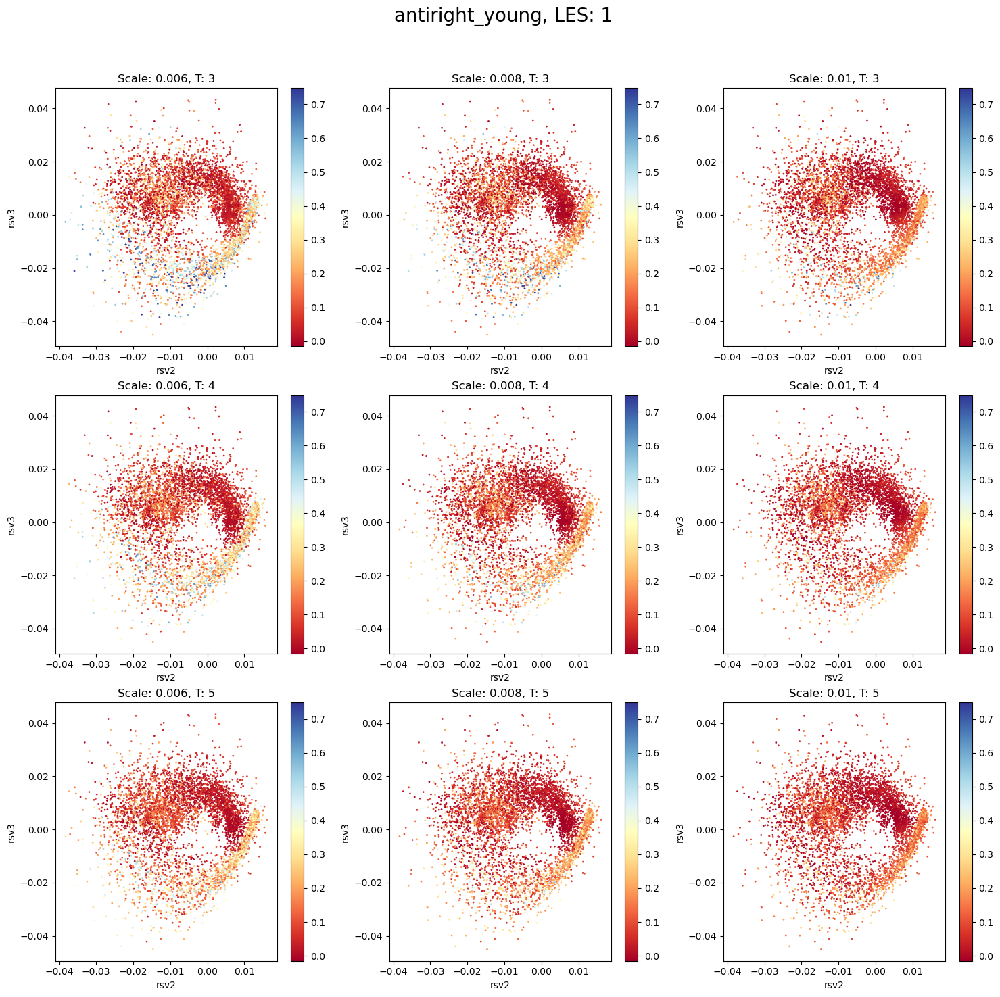

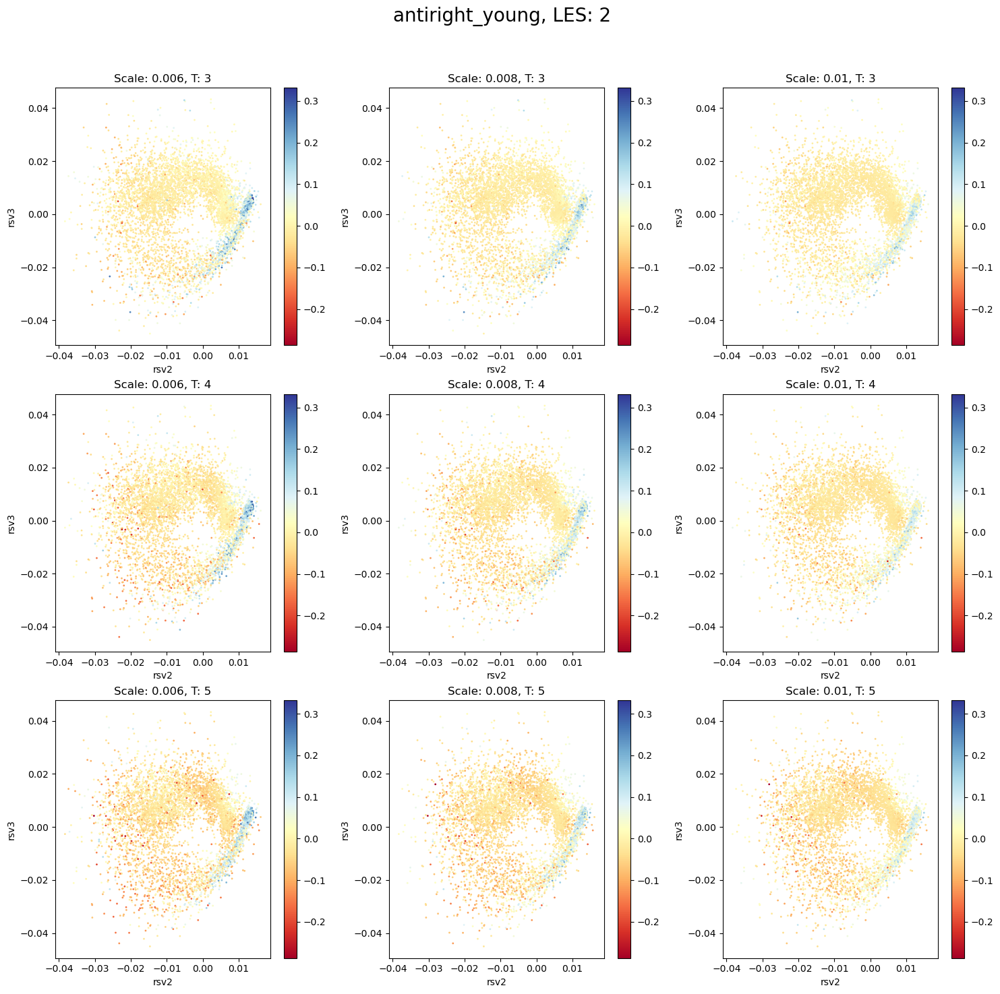

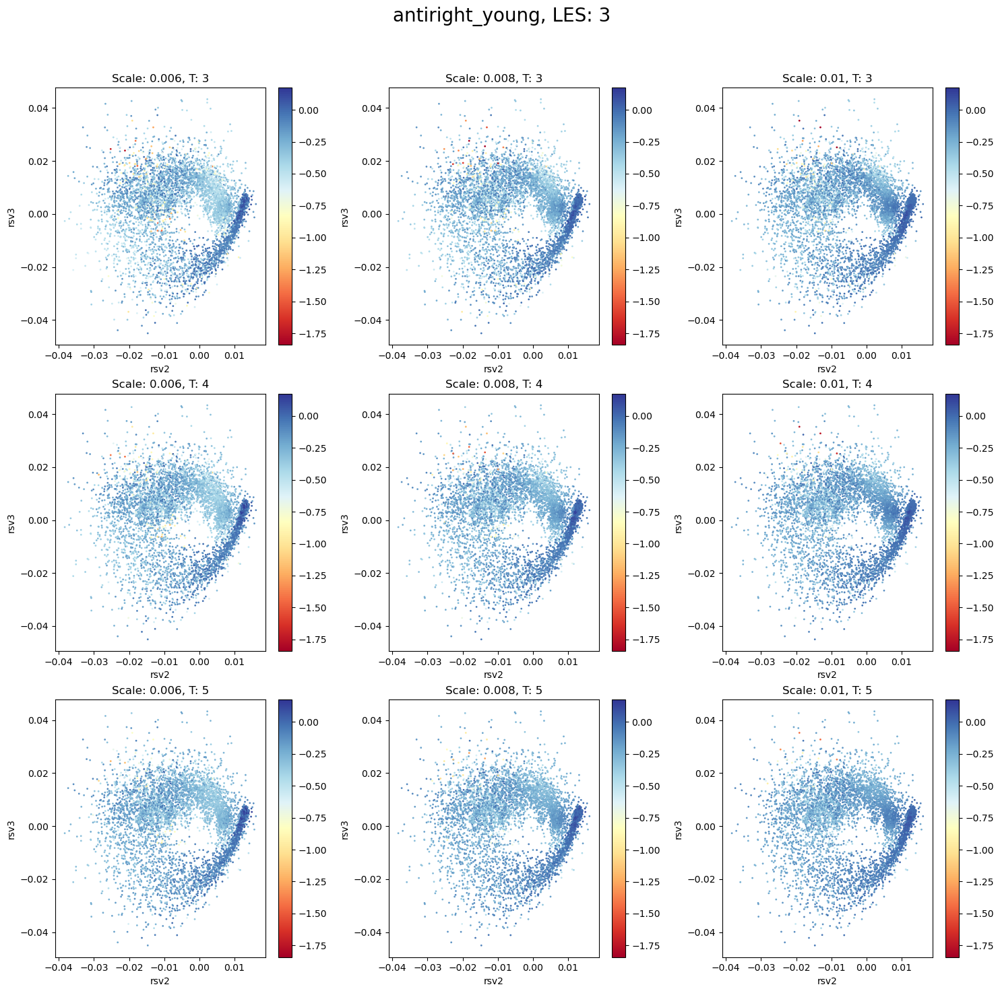

In [15]:
for les_index in range(3):  # Loop over 3 Lyapunov exponents
    les_values = [v['les_vc'][:, les_index] for v in all_ftles.values()]
    global_les_min = np.min([np.min(v) for v in les_values])
    global_les_max = np.max([np.max(v) for v in les_values])
    norm = mcolors.Normalize(vmin=global_les_min*0.8, vmax=global_les_max*0.8)

    fig = plt.figure(figsize=(15, 15))  
    for T_index, T in enumerate(Ts):
        for scale_index, scale in enumerate(scales):
            vc = all_ftles[(T, scale)]['vc']
            les = all_ftles[(T, scale)]['les_vc'][:, les_index]
            # Create a subplot for the current les, scale, and T
            ly_dir = all_ftles[(T, scale)]['lyv_vc'][2,:]
            ax = fig.add_subplot(len(Ts), len(scales), T_index * len(scales) + scale_index + 1)
            p = ax.scatter(vc[1], vc[2], c=les, cmap=cm, s=1, norm=norm)  
            ax.set_xlabel('rsv2')
            ax.set_ylabel('rsv3')
            ax.set_title(f'Scale: {scale}, T: {T}')
            fig.colorbar(p, ax=ax)

    plt.tight_layout()

    #overall title
    overall_title = f"{filename_pattern.split('_batch_')[0]}, LES: {les_index+1}"
    plt.suptitle(overall_title, fontsize=20)

    plt.subplots_adjust(top=0.90)

    plt.savefig(os.path.join(dir, f"{overall_title}_scatter.png"))

    plt.show()


PLOT 2 - density:

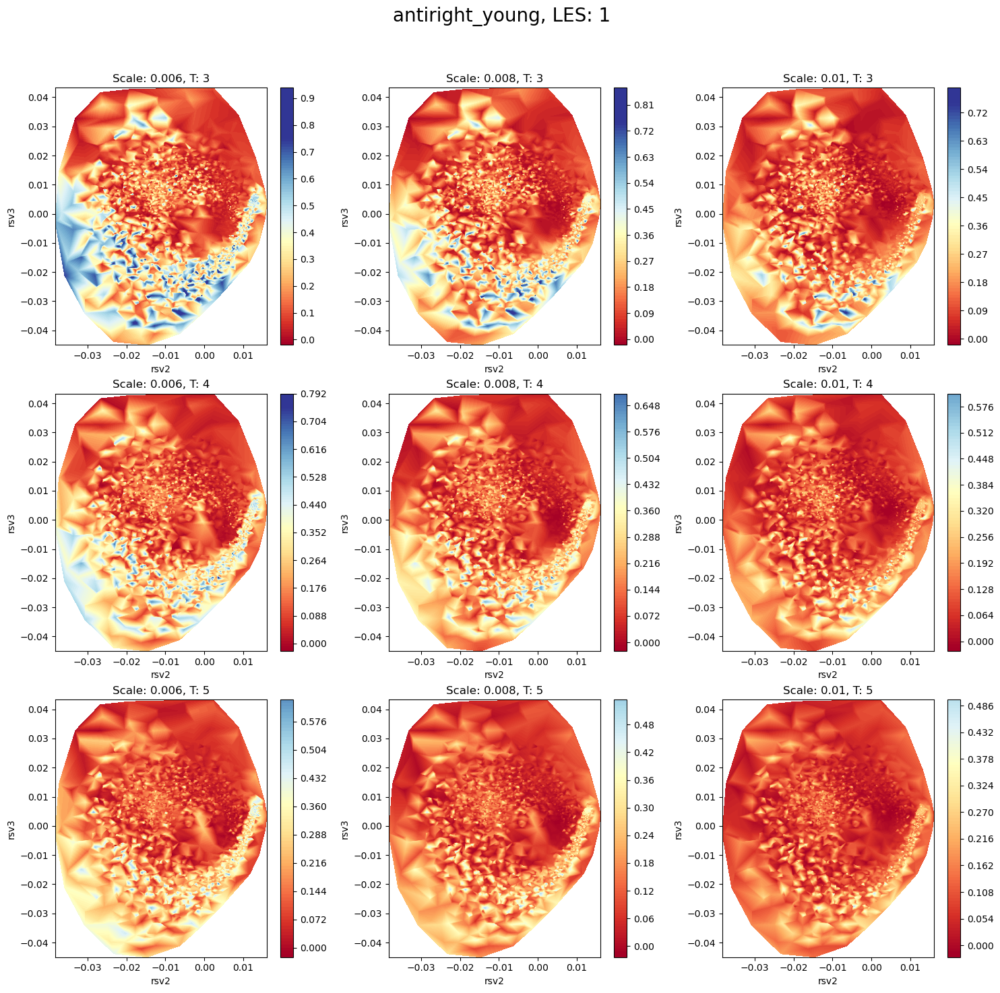

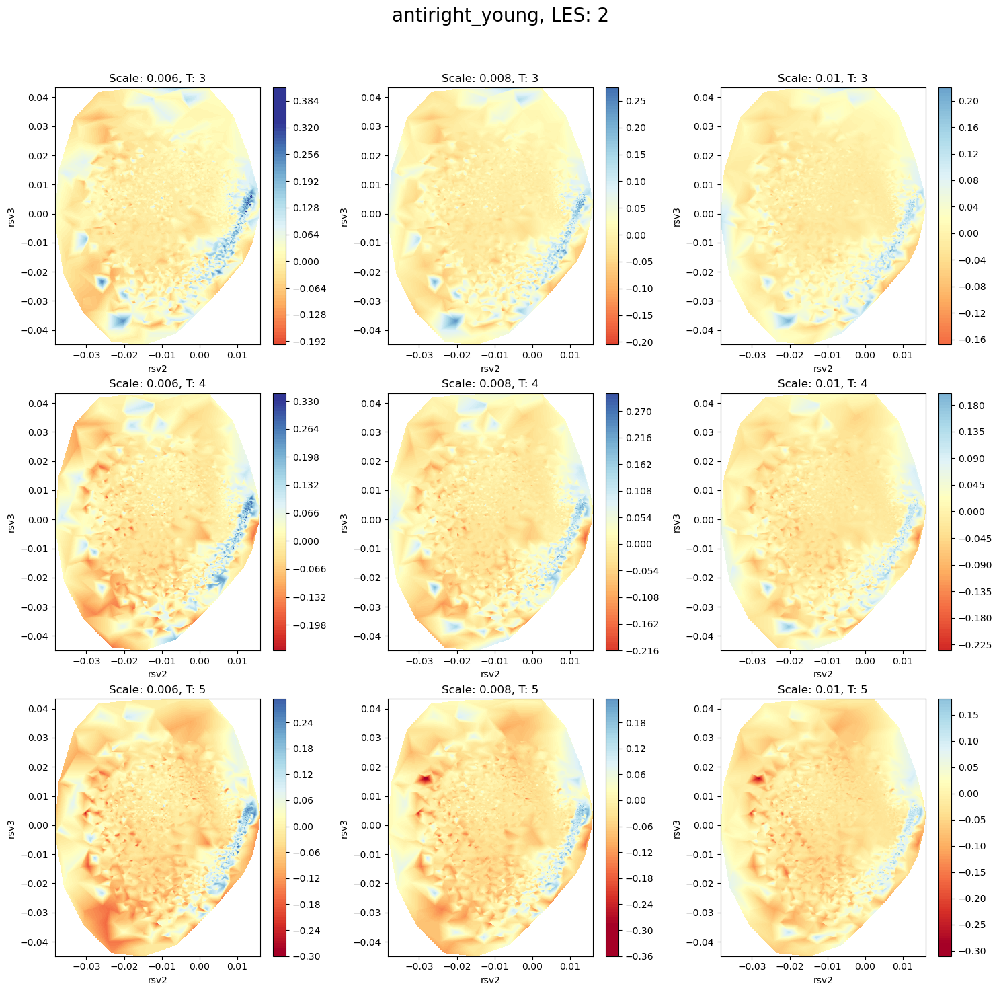

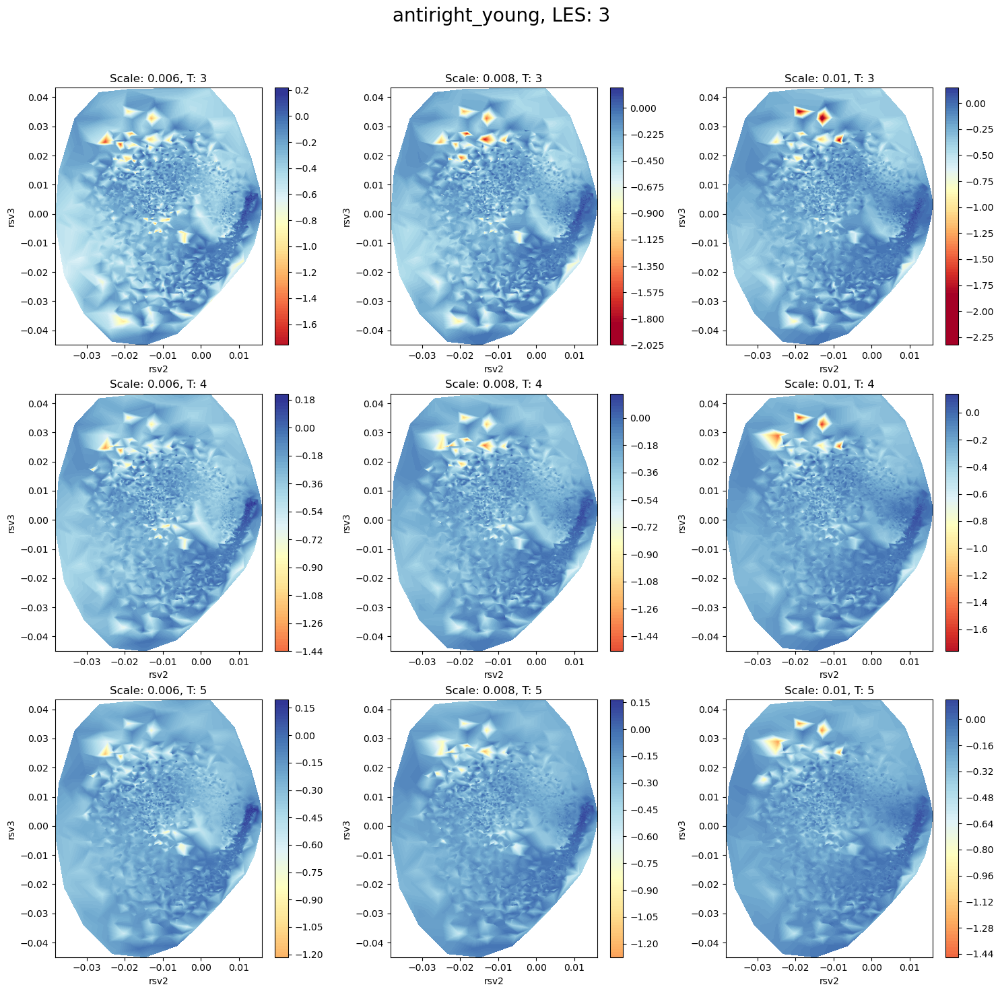

In [16]:

for les_index in range(3):  # Loop over 3 Lyapunov exponents
    les_values = [v['les_vc'][:, les_index] for v in all_ftles.values()]
    global_les_min = np.min([np.min(v) for v in les_values])
    global_les_max = np.max([np.max(v) for v in les_values])
    norm = mcolors.Normalize(vmin=global_les_min*0.8, vmax=global_les_max*0.8)

    fig = plt.figure(figsize=(15, 15))  
    for T_index, T in enumerate(Ts):
        for scale_index, scale in enumerate(scales):
            vc = all_ftles[(T, scale)]['vc']
            les = all_ftles[(T, scale)]['les_vc'][:, les_index]
            # Create a subplot for the current les, scale, and T
            ax = fig.add_subplot(len(Ts), len(scales), T_index * len(scales) + scale_index + 1)
            p = ax.tricontourf(vc[1], vc[2], les, cmap=cm, levels=100, norm=norm)
            ax.set_xlabel('rsv2')
            ax.set_ylabel('rsv3')
            ax.set_title(f'Scale: {scale}, T: {T}')
            fig.colorbar(p, ax=ax)

    plt.tight_layout()

    overall_title = f"{filename_pattern.split('_batch_')[0]}, LES: {les_index+1}"
    plt.suptitle(overall_title, fontsize=20)
    plt.subplots_adjust(top=0.90)
    plt.savefig(os.path.join(dir, f"{overall_title}_tricontourf.png"))

    plt.show()


PLOT 3: quivers!

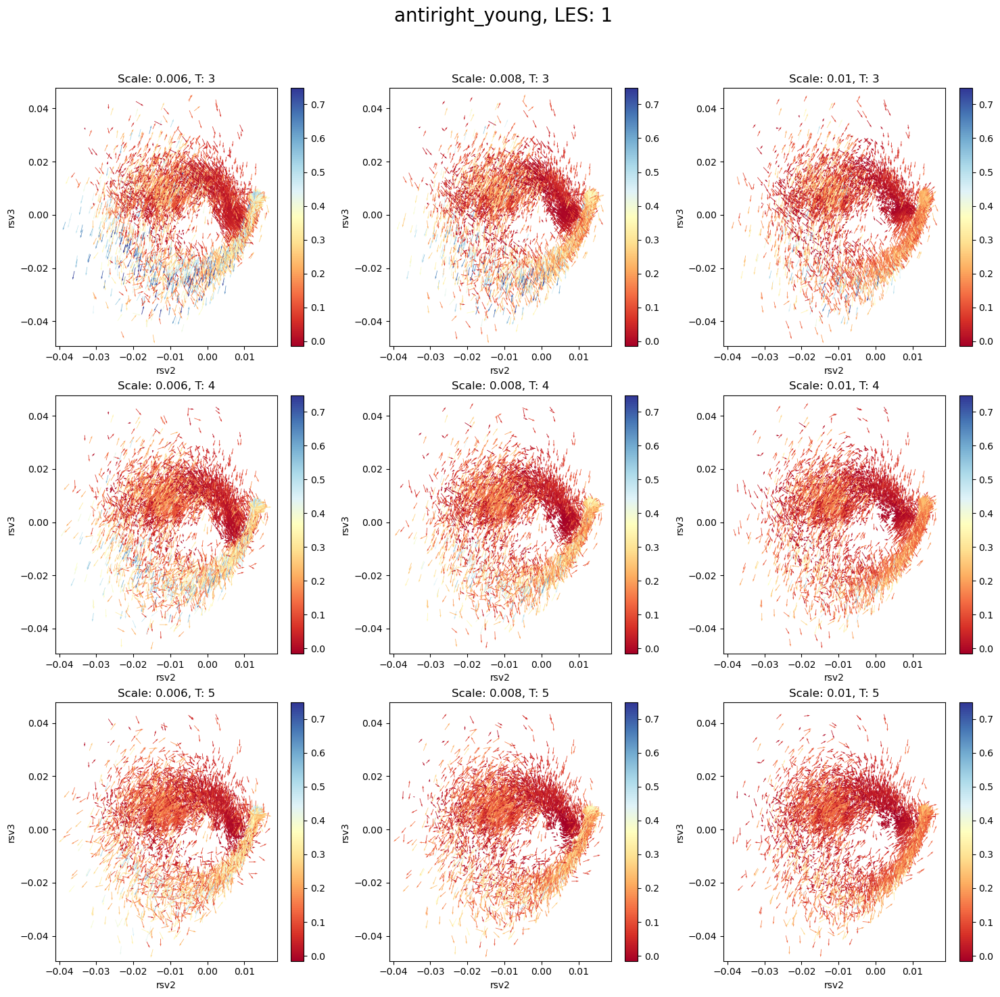

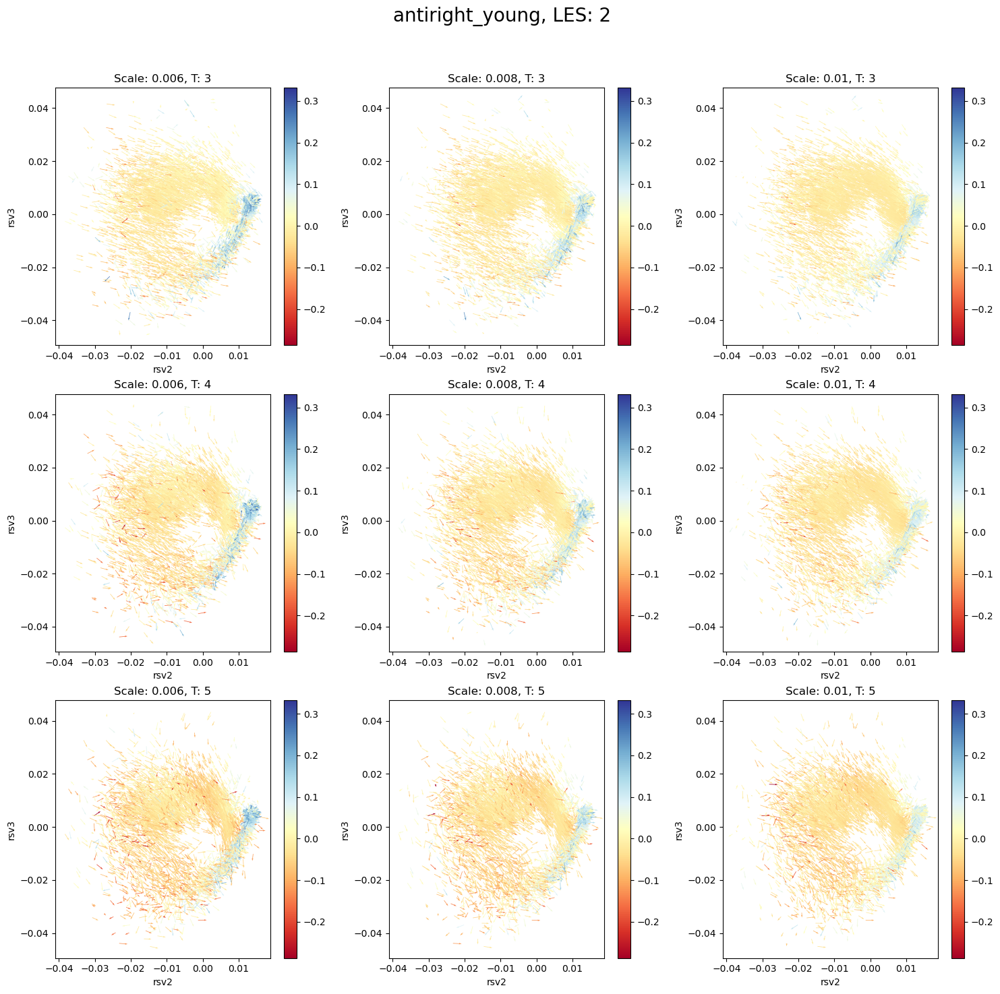

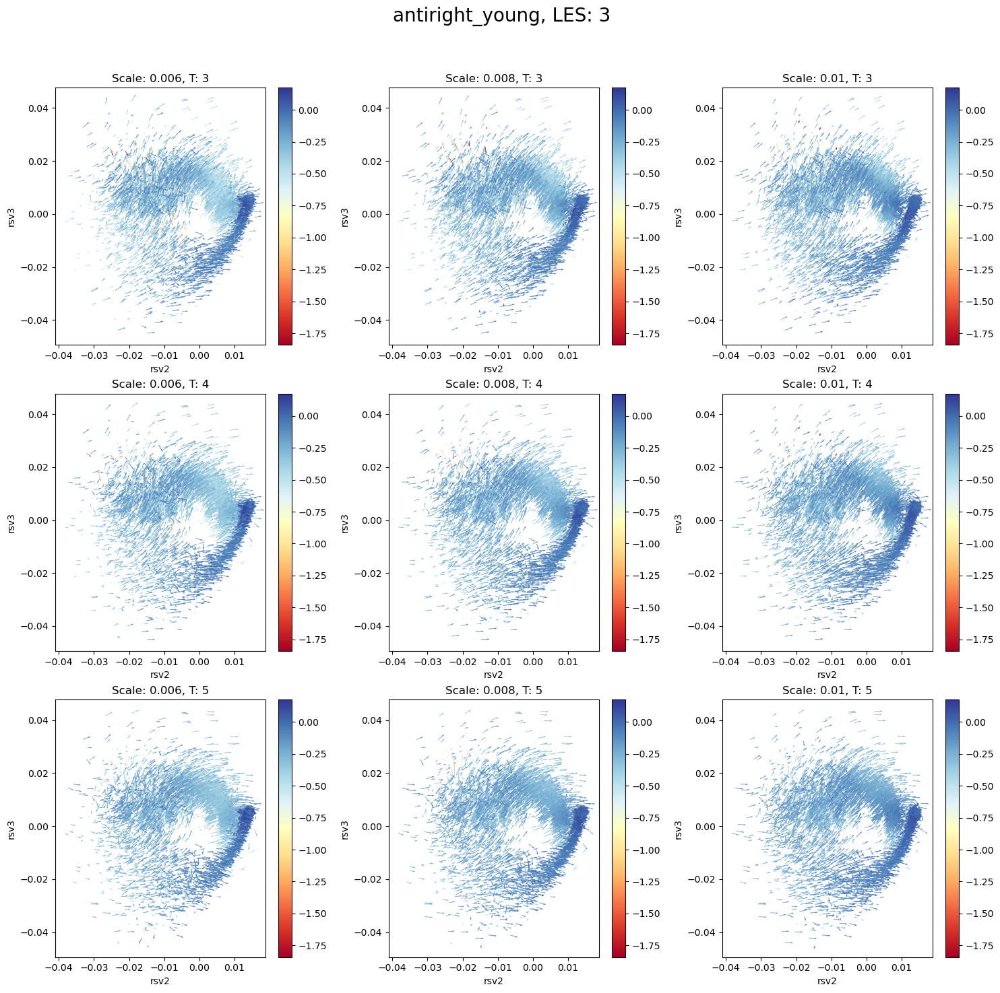

In [17]:
for les_index in range(3):  # Loop over 3 Lyapunov exponents
    les_values = [v['les_vc'][:, les_index] for v in all_ftles.values()]
    global_les_min = np.min([np.min(v) for v in les_values])
    global_les_max = np.max([np.max(v) for v in les_values])
    norm = mcolors.Normalize(vmin=global_les_min*0.8, vmax=global_les_max*0.8)

    fig = plt.figure(figsize=(15, 15)) 
    for T_index, T in enumerate(Ts):
        for scale_index, scale in enumerate(scales):
            vc = all_ftles[(T, scale)]['vc']
            les = all_ftles[(T, scale)]['les_vc'][:, les_index]
            lyp_vc = all_ftles[(T, scale)]['lyv_vc'][les_index,:]
            # Create a subplot for the current les, scale, and T
            ax = fig.add_subplot(len(Ts), len(scales), T_index * len(scales) + scale_index + 1)
            p = ax.quiver(vc[1], vc[2], lyp_vc[1], lyp_vc[2], color=cm(norm(les)), scale=25)
            ax.set_xlabel('rsv2')
            ax.set_ylabel('rsv3')
            ax.set_title(f'Scale: {scale}, T: {T}')

            plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cm), ax=ax)

    plt.tight_layout()
    
    overall_title = f"{filename_pattern.split('_batch_')[0]}, LES: {les_index+1}"
    plt.suptitle(overall_title, fontsize=20)

    plt.subplots_adjust(top=0.90)

    # Save the plot
    plt.savefig(os.path.join(dir, f"{overall_title}_quiver.png"))

    plt.show()


PLOT 4 - direction of quivers

LAST type of the plots (quiver direction)

-> calculates the direction of the vectors and maps them to colors using the colormap. 


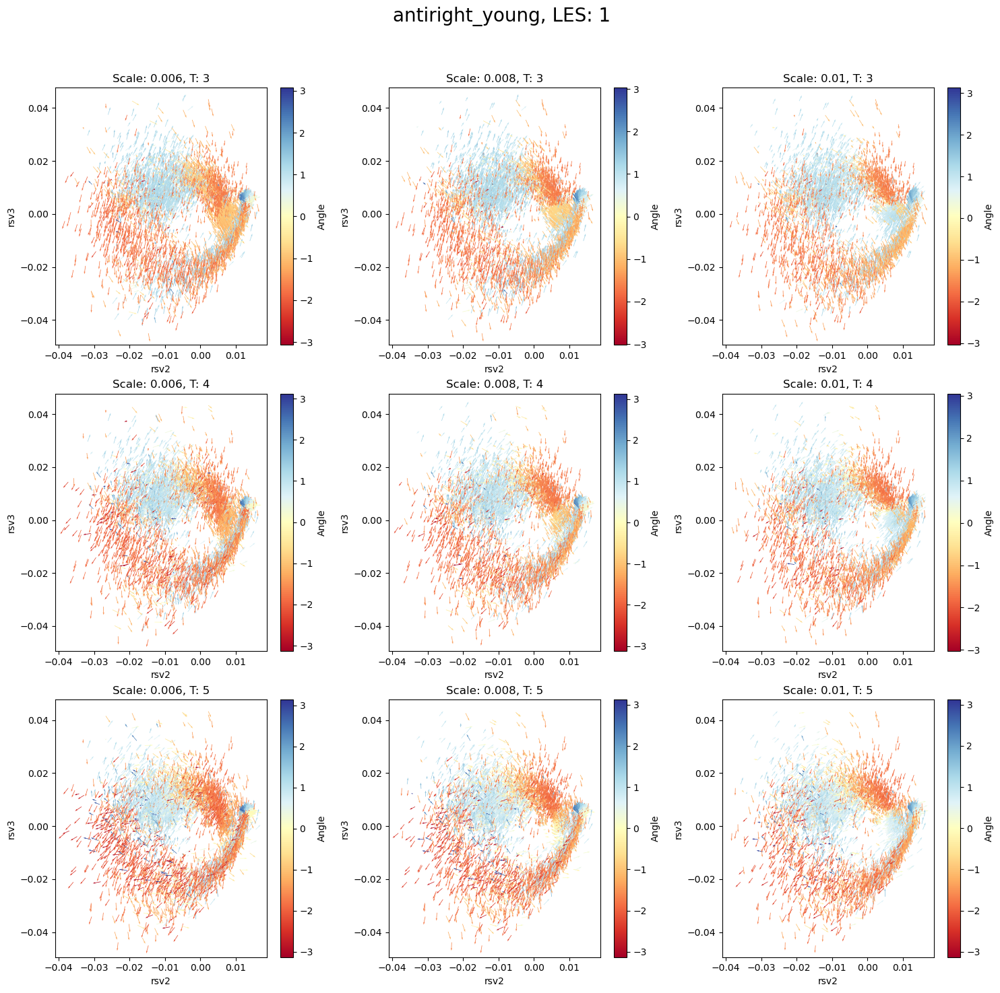

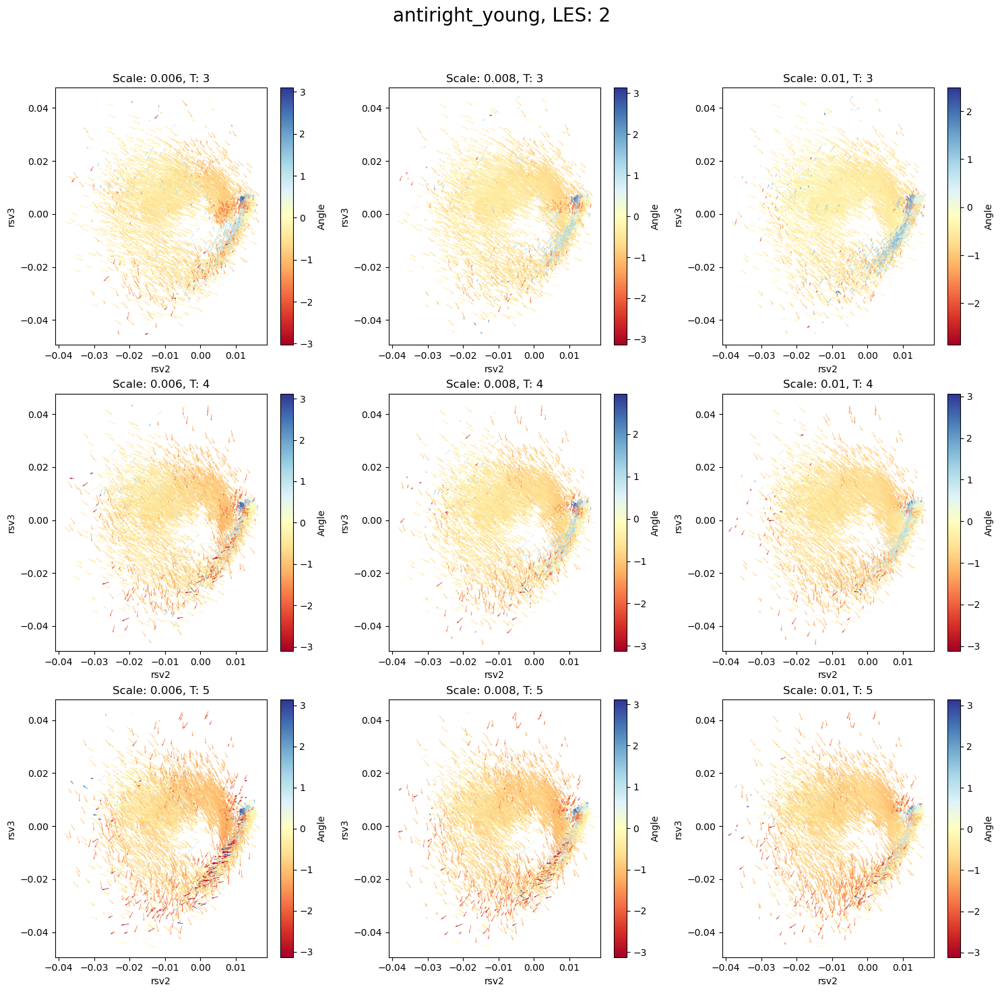

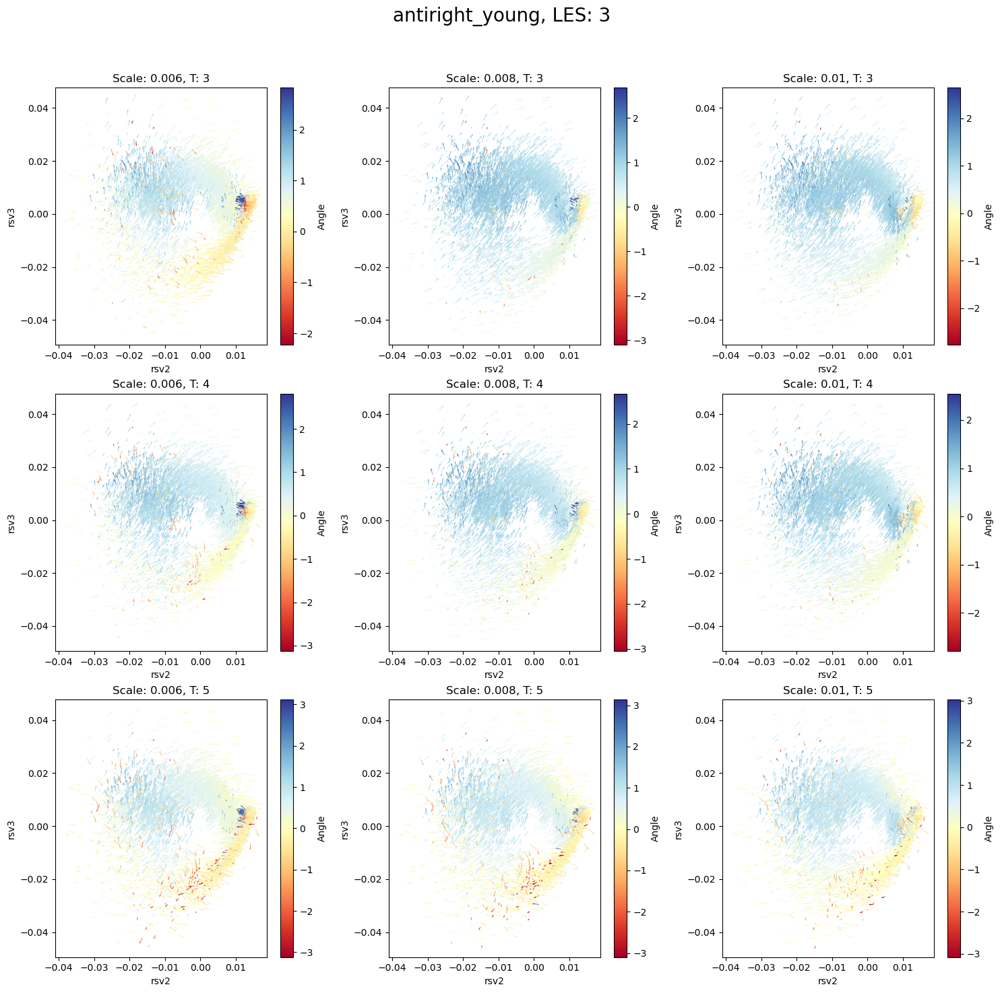

In [20]:
for les_index in range(3):  
    # Calculate 80% of the max and min for colorbar for the current LES
    les_values = [v['les_vc'][:, les_index] for v in all_ftles.values()]
    global_les_min = np.min([np.min(v) for v in les_values])
    global_les_max = np.max([np.max(v) for v in les_values])
    norm = mcolors.Normalize(vmin=global_les_min*0.8, vmax=global_les_max*0.8)

    fig = plt.figure(figsize=(15, 15))  # New figure for each Lyapunov exponent
    for T_index, T in enumerate(Ts):
        for scale_index, scale in enumerate(scales):
            vc = all_ftles[(T, scale)]['vc']
            les = all_ftles[(T, scale)]['les_vc'][:, les_index]
            lyp_vc = all_ftles[(T, scale)]['lyv_vc'][les_index, :]

            # Calculate direction of vectors (angle with x-axis)
            direction = np.arctan2(lyp_vc[2], lyp_vc[1])
            # Normalize to [0, 1]
            norm_direction = mcolors.Normalize(vmin=direction.min(), vmax=direction.max())
            # Get corresponding colors from colormap based on angle
            colors = cm(norm_direction(direction))

            ax = fig.add_subplot(len(Ts), len(scales), T_index * len(scales) + scale_index + 1)
            p = ax.quiver(vc[1], vc[2], lyp_vc[1], lyp_vc[2], color=colors, scale=25)
            ax.set_xlabel('rsv2')
            ax.set_ylabel('rsv3')
            ax.set_title(f'Scale: {scale}, T: {T}')

            sm = plt.cm.ScalarMappable(norm=norm_direction, cmap=cm)
            cbar = plt.colorbar(sm, ax=ax)
            cbar.set_label('Angle')

    plt.tight_layout()

    overall_title = f"{filename_pattern.split('_batch_')[0]}, LES: {les_index+1}"
    plt.suptitle(overall_title, fontsize=20)

    plt.subplots_adjust(top=0.90)

    plt.savefig(os.path.join(dir, f"{overall_title}_quiver_direction.png"))

    plt.show()
